<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b>Investing Negative `totFlux` in HSC Cosmos</b> <br>
Contact author: Erin Howard<br>
Last verified to run: May 25, 2023<br>
LSST Science Piplines version: w_2023_08<br>
Container Size: Large <br>

# DM-32888: Investigate Negative `totFlux` Values Using January 2023 Run

## Run details

* Used weekly `w_2022_49` with `subtractImagesWithFakes:config:mode:auto`
* Working directory on USDF with bps logs, pipelines, etc. is `/sdf/group/rubin/user/elhoward/repo-main-logs/DM-37206`
* Templates are in `u/mrawls/DM-34711/templates`
* Final processing of HSC COSMOS is in `u/elhoward/DM-37206/HSC-fakes`
* Postgres schema is `elhoward_dm37206_hsc_appipewithfakes`

For ApPipeWithFakes.yaml:
```
inCollection: u/mrawls/DM-34711/templates,HSC/raw/RC2/9813,HSC/calib,HSC/masks,refcats,skymaps
dataQuery: "instrument='HSC' AND skymap='hsc_rings_v1' AND band IN ('g', 'r', 'i', 'z', 'y')"
```

## Analysis Summary

* Of the 286 DiaSources that are not flagged, all of them have terrible templates that look inverted.
  * Appears to be band dependent with `r` band having the most negative `totFlux` sources.
* Most of the negative `totFlux` fake sources are near zero, which indicates noise.
* Future analysis should be done on updated templates and without fakes.

## Table of Contents

1. [Loading DiaObjects and DiaSources](#section_1)
2. [Negative `totflux` counts and flags](#section_2)
3. [Negative `totflux` by ra/dec, visit, and filter](#section_3)]
4. [Negative `totflux` as fakes](#section_4)
5. [Negative `totflux` as cutouts](#section_5)

In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import lsst.daf.butler as dafButler
from lsst.analysis.ap import legacyPlotUtils as plac
from lsst.analysis.ap import apdb

from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig
import functools
import operator
from IPython.display import Image, display

from lsst.analysis.ap import zooniverseCutouts as zoo

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

plt.set_loglevel('WARNING')

In [2]:
badFlagList=['base_PixelFlags_flag_bad',
             'base_PixelFlags_flag_suspect',
             'base_PixelFlags_flag_saturatedCenter',
             'base_PixelFlags_flag_interpolated',
             'base_PixelFlags_flag_interpolatedCenter',
             'base_PixelFlags_flag_edge',
             ]

In [3]:
def flagTables(sourceTable, badFlagList, butler, instrument=None):
    """Apply flag filters to a DIA Source and a DIA Object table.
    Parameters
    ----------
    sourceTable : `pandas.core.frame.DataFrame`
        Pandas dataframe with DIA Sources from an APDB.
    badFlagList :  `list`
        Names of flags presumed to each indicate a DIA Source is garbage.
     instrument : `str`
        Default is 'DECam'
    Returns
    -------
    sourceTableFlags : `pandas.core.frame.DataFrame`
        Dataframe containing all DIA Sources from sourceTable
        with flags expanded.
    goodSrcFlags : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Sources from sourceTable
        with no bad flags, with all flags expanded.
    """
    try:
        #addTableMetadata(sourceTable, butler=butler, instrument=instrument)
        instrumentDataId = butler.registry.expandDataId(instrument=instrument)
        packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
        dataId = packer.unpack(sourceTable.ccdVisitId)
        sourceTable['visit'] = dataId['visit']
        sourceTable['detector'] = dataId['detector']
        sourceTable['instrument'] = instrument
    except:
        pass
    config = TransformDiaSourceCatalogConfig()
    unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
    flagValues = unpacker.unpack(sourceTable['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=sourceTable.index)
    sourceTableFlags = pd.merge(sourceTable, flagTable, left_index=True, right_index=True)
    badFlags = [sourceTableFlags[flag] for flag in badFlagList]
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    goodSrcFlags = sourceTableFlags.loc[noFlagFilter]
    return sourceTableFlags, goodSrcFlags

## 1. <a id="section_1">Loading DiaObjects and DiaSources</a>

In [4]:
repo = '/repo/main'
instrument = 'HSC'
skymap = 'hsc_rings_v1'

dbType='postgres'
dbName='lsst-devl'

collections = 'u/elhoward/DM-37206/HSC-fakes'
schema = 'elhoward_dm37206_hsc_appipewithfakes'
month = 'January'
year = '2023'

collectionsList = [collections]

butler = dafButler.Butler(repo, collections=collections)
apdbQuery = apdb.ApdbPostgresQuery(schema, butler=butler, instrument=instrument)

In [5]:
with apdbQuery.connection as connection:
    srcTable = pd.read_sql_query('SELECT "diaSourceId", "diaObjectId", "spuriousness", \
                                 "ra", "decl", "ccdVisitId", "psChi2", "psNdata", \
                                 "apFlux", "apFluxErr", "psFlux", "psFluxErr", "filterName", \
                                 "totFlux", "totFluxErr", "snr", "x", "y", "isDipole", "flags" \
                                 FROM "{}"."DiaSource" \
                                 WHERE "totFlux" < 0; \
                                '.format(schema), connection)

In [6]:
all_neg_totFlux, good_neg_totFlux = flagTables(srcTable, badFlagList, butler, instrument)

## 2. <a id="section_2">Negative `totFlux` counts and flags</a>

In [7]:
num_all = len(all_neg_totFlux)
num_good = len(good_neg_totFlux)

print("There are " + str(num_all) + " negative totFlux values in all sources and " + str(num_good) + " negative totFlux values in good sources.")

There are 1304078 negative totFlux values in all sources and 218505 negative totFlux values in good sources.


In [8]:
print("The lowest negative totFlux value for all sources is" + str(min(all_neg_totFlux.totFlux)))
print("The highest negative totFlux value for all sources is" + str(max(all_neg_totFlux.totFlux)))

The lowest negative totFlux value for all sources is-713545290912.8173
The highest negative totFlux value for all sources is-0.0002749420760242474


In [9]:
print("The lowest negative totFlux value for good sources is" + str(min(good_neg_totFlux.totFlux)))
print("The highest negative totFlux value for good sources is" + str(max(good_neg_totFlux.totFlux)))

The lowest negative totFlux value for good sources is-296898.5136750554
The highest negative totFlux value for good sources is-0.0010713273278123686


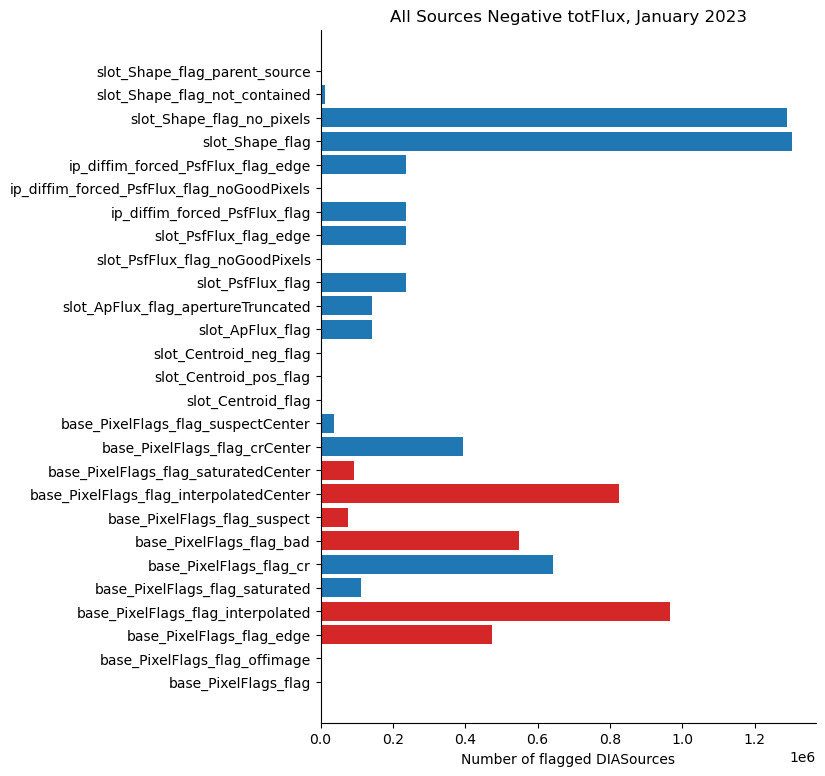

In [10]:
plac.plotFlagHist(all_neg_totFlux, title=f'All Sources Negative totFlux, {month} {year}', badFlagList=badFlagList)

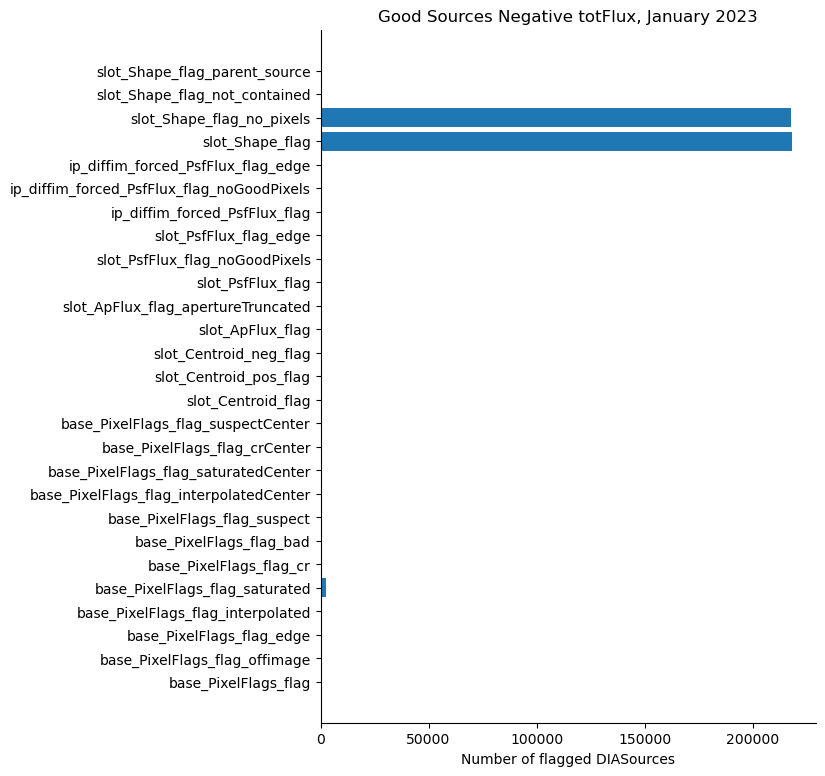

In [11]:
plac.plotFlagHist(good_neg_totFlux, title=f'Good Sources Negative totFlux, {month} {year}', badFlagList=badFlagList)

Now let's check out that `slot_Shape_flag_no_pixels` and `slot_Shape_flag` to see if those two cover the whole swath of negative `totFlux`es.

First up, `slot_Shape_flag_no_pixels`:

In [12]:
is_slot_Shape_flag_no_pixels = np.array(all_neg_totFlux.slot_Shape_flag_no_pixels == True)
all_slot_Shape_flag_no_pixels = all_neg_totFlux[is_slot_Shape_flag_no_pixels]
num_all_slot_Shape_flag_no_pixels = len(all_slot_Shape_flag_no_pixels)

print("There are " + str(num_all) + " negative totFlux values in all sources and " + str(num_all_slot_Shape_flag_no_pixels) + 
      " negative totFlux with the num_all_slot_Shape_flag_no_pixels.")
print("That is a difference of " + str(num_all-num_all_slot_Shape_flag_no_pixels) + ".")

There are 1304078 negative totFlux values in all sources and 1290164 negative totFlux with the num_all_slot_Shape_flag_no_pixels.
That is a difference of 13914.


In [13]:
is_slot_Shape_flag_no_pixels = np.array(good_neg_totFlux.slot_Shape_flag_no_pixels == True)
good_slot_Shape_flag_no_pixels = good_neg_totFlux[is_slot_Shape_flag_no_pixels]
num_good_slot_Shape_flag_no_pixels = len(good_slot_Shape_flag_no_pixels)

print("There are " + str(num_good) + " negative totFlux values in good sources and " + str(num_good_slot_Shape_flag_no_pixels) + 
      " negative totFlux with the slot_Shape_flag_no_pixels.")
print("That is a difference of " + str(num_good-num_good_slot_Shape_flag_no_pixels) + ".")

There are 218505 negative totFlux values in good sources and 217699 negative totFlux with the slot_Shape_flag_no_pixels.
That is a difference of 806.


Now, `slot_Shape_flag`:

In [14]:
is_slot_shape_flag = np.array(all_neg_totFlux.slot_Shape_flag == True)
all_slot_shape_flag = all_neg_totFlux[is_slot_shape_flag]
num_all_slot_shape_flag = len(all_slot_shape_flag)

print("There are " + str(num_all) + " negative totFlux values in all sources and " + str(num_all_slot_shape_flag) + 
      " negative totFlux with the slot_Shape_flag.")
print("That is a difference of " + str(num_all-num_all_slot_shape_flag) + ".")

There are 1304078 negative totFlux values in all sources and 1303450 negative totFlux with the slot_Shape_flag.
That is a difference of 628.


In [15]:
is_slot_shape_flag = np.array(good_neg_totFlux.slot_Shape_flag == True)
good_slot_shape_flag = good_neg_totFlux[is_slot_shape_flag]
num_good_slot_shape_flag = len(good_slot_shape_flag)

print("There are " + str(num_good) + " negative totFlux values in good sources and " + str(num_good_slot_shape_flag) + 
      " negative totFlux with the slot_Shape_flag.")
print("That is a difference of " + str(num_good-num_good_slot_shape_flag) + ".")

There are 218505 negative totFlux values in good sources and 218267 negative totFlux with the slot_Shape_flag.
That is a difference of 238.


Let's check either...

In [16]:
is_flagged = np.array((all_neg_totFlux.slot_Shape_flag == True) | 
                      (all_neg_totFlux.slot_Shape_flag_no_pixels == True))
all_flagged = all_neg_totFlux[is_flagged]
num_all_flagged = len(all_flagged)

print("There are " + str(num_all) + " negative totFlux values in all sources and " + str(num_all_flagged) + 
      " negative totFlux with the slot_Shape_flag OR slot_Shape_flag_no_pixels.")
print("That is a difference of " + str(num_all-num_all_flagged) + ".")

There are 1304078 negative totFlux values in all sources and 1303450 negative totFlux with the slot_Shape_flag OR slot_Shape_flag_no_pixels.
That is a difference of 628.


In [17]:
is_flagged = np.array((good_neg_totFlux.slot_Shape_flag == True) | 
                      (good_neg_totFlux.slot_Shape_flag_no_pixels == True))
good_flagged = good_neg_totFlux[is_flagged]
num_good_flagged = len(good_flagged)

print("There are " + str(num_good) + " negative totFlux values in good sources and " + str(num_good_slot_shape_flag) + 
      " negative totFlux with the slot_Shape_flag OR slot_Shape_flag_no_pixels.")
print("That is a difference of " + str(num_good-num_good_flagged) + ".")

There are 218505 negative totFlux values in good sources and 218267 negative totFlux with the slot_Shape_flag OR slot_Shape_flag_no_pixels.
That is a difference of 238.


Looks like all marked with `slot_Shape_flag_no_pixels` is also marked with the `num_all_slot_shape_flag`. But what about those 628?

In [18]:
is_not_flagged = np.array((all_neg_totFlux.slot_Shape_flag != True) & 
                      (all_neg_totFlux.slot_Shape_flag_no_pixels != True))
all_not_flagged = all_neg_totFlux[is_not_flagged].reset_index(drop=True)
num_all_not_flagged = len(all_not_flagged)
num_all_not_flagged

628

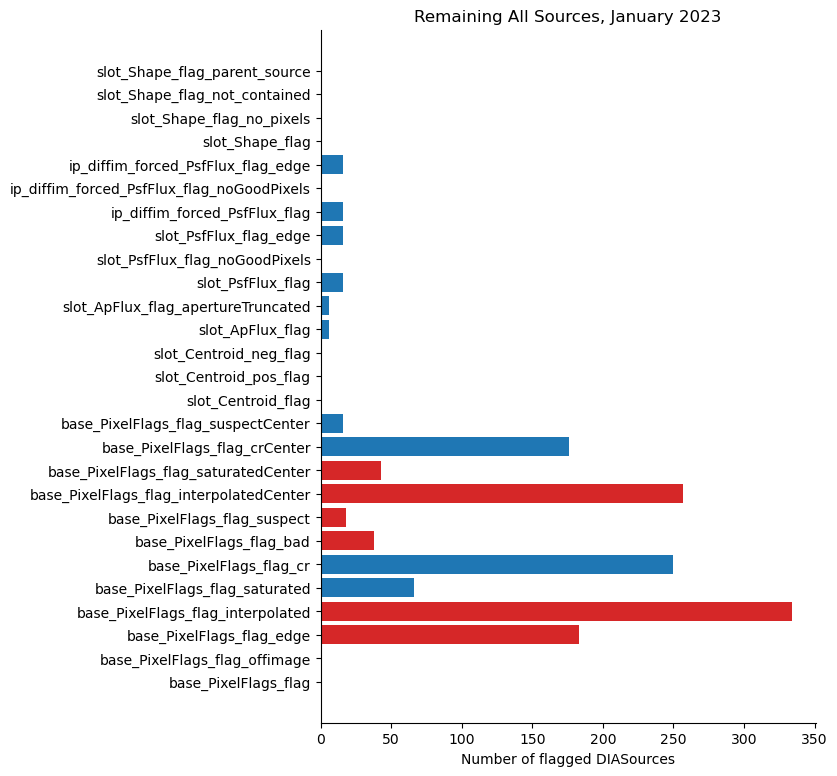

In [19]:
plac.plotFlagHist(all_not_flagged, title=f'Remaining All Sources, {month} {year}', badFlagList=badFlagList)

#### Investigating the remaining unflagged good sources

But the remaining good sources are all unflagged! And only one of the 238 remaining sources is a dipole.

In [20]:
is_not_flagged = np.array((good_neg_totFlux.slot_Shape_flag != True) & 
                      (good_neg_totFlux.slot_Shape_flag_no_pixels != True))
good_not_flagged = good_neg_totFlux[is_not_flagged].reset_index(drop=True)
num_good_not_flagged = len(good_not_flagged)
num_good_not_flagged

238

In [21]:
print("The lowest negative totFlux value for the remaining unflagged good sources is" + str(min(good_not_flagged.totFlux)))
print("The highest negative totFlux value for the remaining unflagged good sources is" + str(max(good_not_flagged.totFlux)))

The lowest negative totFlux value for the remaining unflagged good sources is-111.62402444666482
The highest negative totFlux value for the remaining unflagged good sources is-0.42671711216424335


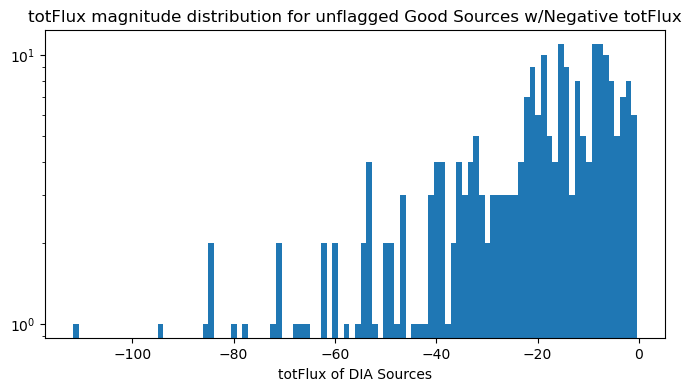

In [22]:
plt.figure(figsize=(8,4))
plt.hist(good_not_flagged.totFlux, bins=100)
plt.title('totFlux magnitude distribution for unflagged Good Sources w/Negative totFlux')
plt.xlabel('totFlux of DIA Sources')
plt.yscale('log')

In [23]:
good_not_flagged['flags'].sum()

0

In [24]:
isDipole = np.array(good_not_flagged.isDipole == True)
num_good_dipole = len(good_not_flagged[isDipole])
num_good_dipole

1

## 3. <a id="section_3">Negative `totFlux` by ra/dec, visit, and filter</a>

### By RA/Dec

No apparent correlation with the location of the negative `totFlux` sources.

Text(0.5, 1.0, 'All DIA Sources (with negative totFluxes)')

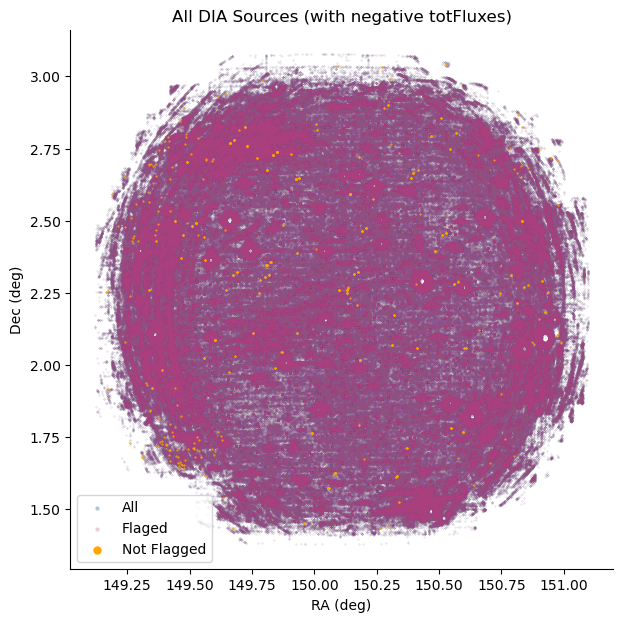

In [25]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(111)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(all_neg_totFlux['ra'], all_neg_totFlux['decl'], c='#003f5c', s=0.2, marker=".", alpha=0.2, label="All")
ax.scatter(all_flagged['ra'], all_flagged['decl'], c='#bc5090', s=0.2, marker=".", alpha=0.2, label="Flaged")
ax.scatter(all_not_flagged['ra'], all_not_flagged['decl'], c='#ffa600', s=1, marker=".", label="Not Flagged")
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.legend(loc="lower left", markerscale=10)
plt.title('All DIA Sources (with negative totFluxes)')

Text(0.5, 1.0, 'Good DIA Sources (with negative totFluxes)')

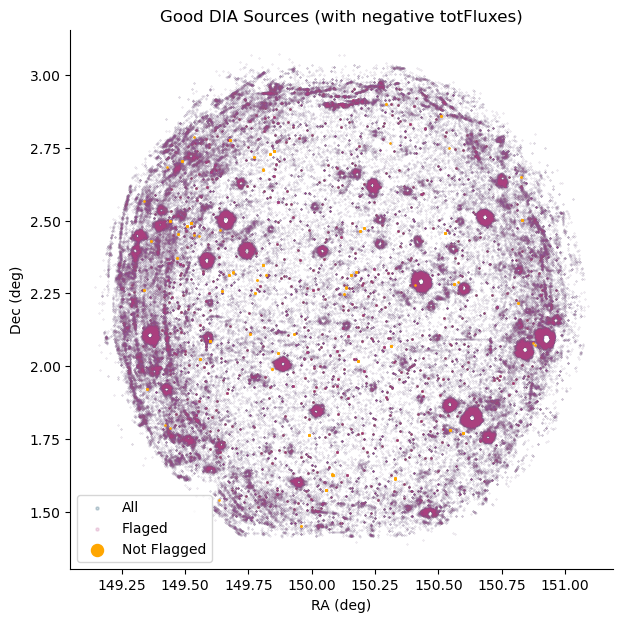

In [26]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(111)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(good_neg_totFlux['ra'], good_neg_totFlux['decl'], c='#003f5c', s=0.2, marker=".", alpha=0.2, label="All")
ax.scatter(good_flagged['ra'], good_flagged['decl'], c='#bc5090', s=0.2, marker=".", alpha=0.2, label="Flaged")
ax.scatter(good_not_flagged['ra'], good_not_flagged['decl'], c='#ffa600', s=3, marker=".", label="Not Flagged")
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.legend(loc="lower left", markerscale=10)
plt.title('Good DIA Sources (with negative totFluxes)')

Text(0.5, 1.0, 'DIA Sources (with negative totFluxes)')

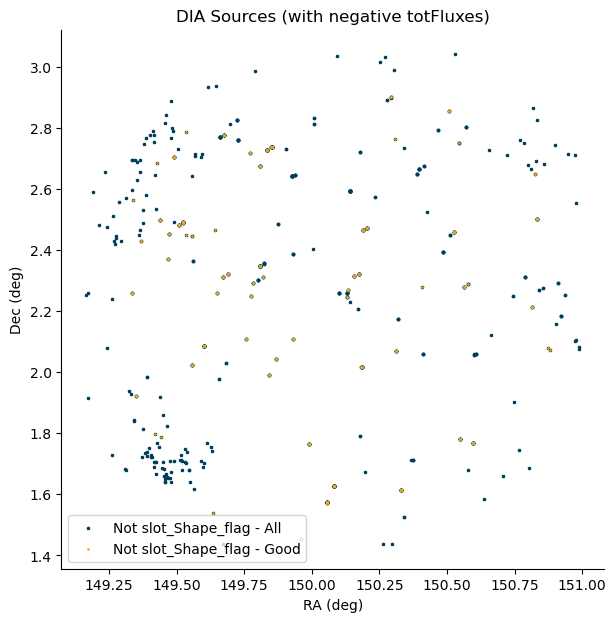

In [27]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(111)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(all_not_flagged['ra'], all_not_flagged['decl'], c='#003f5c', s=3, marker="x", label="Not slot_Shape_flag - All")
ax.scatter(good_not_flagged['ra'], good_not_flagged['decl'], c='#ffa600', s=3, marker=".", label="Not slot_Shape_flag - Good")
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.legend(loc="lower left")
plt.title('DIA Sources (with negative totFluxes)')

Text(0.5, 1.0, 'DIA Sources (with negative totFluxes)')

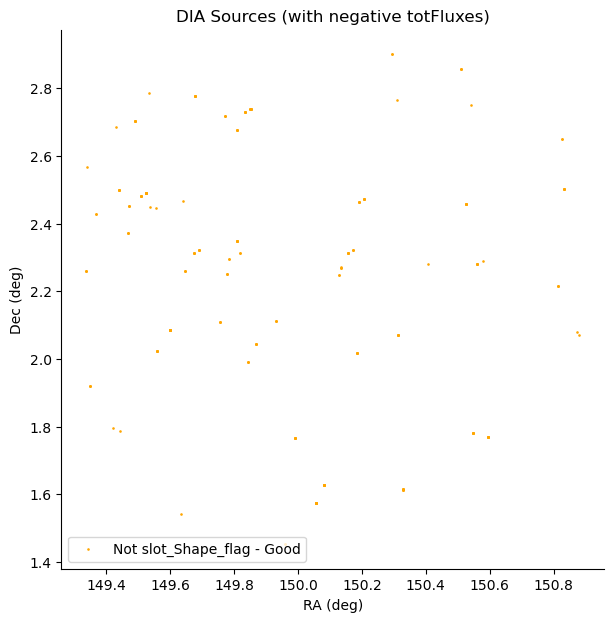

In [28]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(111)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(good_not_flagged['ra'], good_not_flagged['decl'], c='#ffa600', s=3, marker=".", label="Not slot_Shape_flag - Good")
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.legend(loc="lower left")
plt.title('DIA Sources (with negative totFluxes)')

### By Visit

#### All negative `totFlux` sources

Nothing particularly interesting in the spread.

In [29]:
all_neg_totFlux_by_visit = all_neg_totFlux.groupby(['visit']).size().reset_index(name='count')
all_neg_totFlux_by_visit['visit'] = all_neg_totFlux_by_visit['visit'].astype(str)

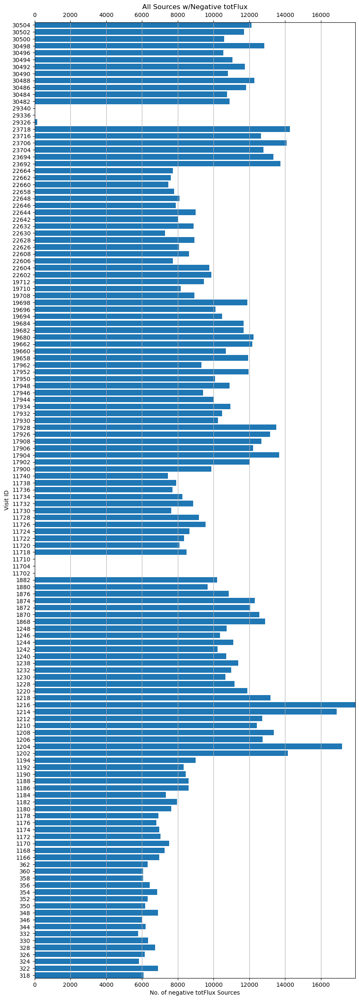

In [30]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_visit['visit'], all_neg_totFlux_by_visit['count'])
plt.ylabel("Visit ID")
plt.xlabel("No. of negative totFlux Sources")
plt.title("All Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

#### Good negative `totFlux` sources

Things get interesting when you isolate the 238 good negative `totFlux` sources that were unflagged. It's unevenly distributed among the visits.

In [31]:
good_not_flagged_by_visit = good_not_flagged.groupby(['visit']).size().reset_index(name='count')
good_not_flagged_by_visit['visit'] = good_not_flagged_by_visit['visit'].astype(str)

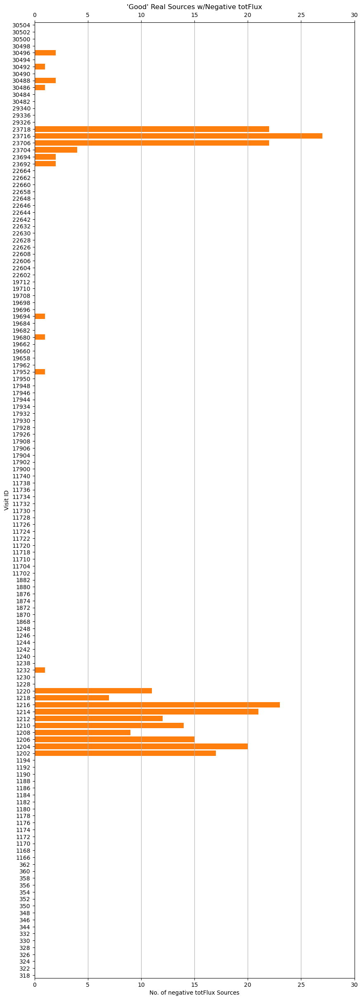

In [32]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_visit['visit'], all_neg_totFlux_by_visit['count'], alpha=0)
plt.barh(good_not_flagged_by_visit['visit'], good_not_flagged_by_visit['count'])
plt.ylabel("Visit ID")
plt.xlabel("No. of negative totFlux Sources")
plt.title("'Good' Real Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.xlim(0, 30)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

### By Detector

#### All negative `totFlux` sources

Negative `totFlux` sources are unevenly distributed among the detectors.

In [33]:
all_neg_totFlux_by_detector = all_neg_totFlux.groupby(['detector']).size().reset_index(name='count')
all_neg_totFlux_by_detector['detector'] = all_neg_totFlux_by_detector['detector'].astype(str)

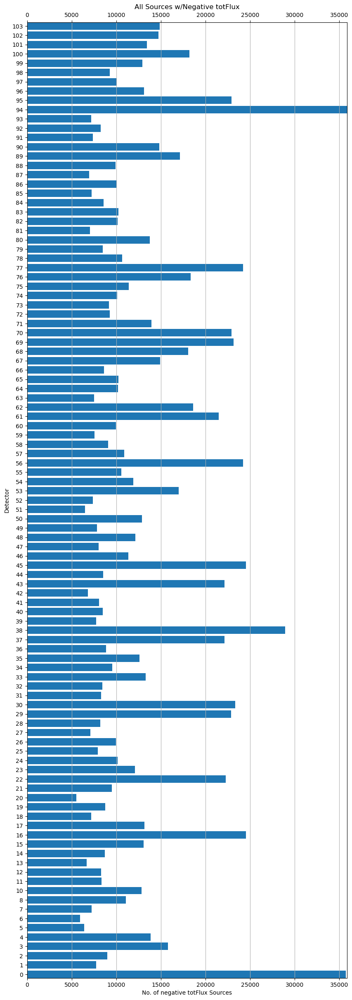

In [34]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_detector['detector'], all_neg_totFlux_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("All Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

#### Good negative `totFlux` sources

Negative `totFlux` sources are unevenly distributed among the detectors when you isolate the 238 good sources.

In [35]:
good_not_flagged_by_detector = good_not_flagged.groupby(['detector']).size().reset_index(name='count')
good_not_flagged_by_detector['detector'] = good_not_flagged_by_detector['detector'].astype(str)

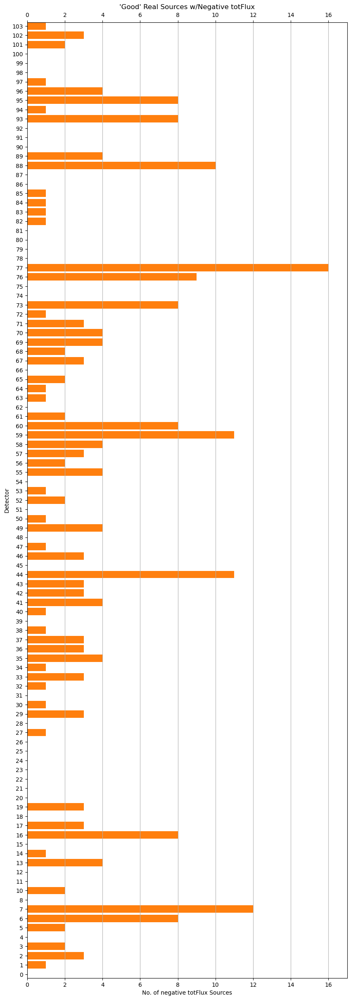

In [36]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_detector['detector'], all_neg_totFlux_by_detector['count'], alpha=0)
plt.barh(good_not_flagged_by_detector['detector'], good_not_flagged_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("'Good' Real Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.xlim(0, 17)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

### By Filter

#### All negative `totFlux` sources

In [37]:
all_neg_totFlux_by_filter = all_neg_totFlux.groupby(['filterName']).size().reset_index(name='count')
all_neg_totFlux_by_filter['filterName'] = all_neg_totFlux_by_filter['filterName'].astype(str)

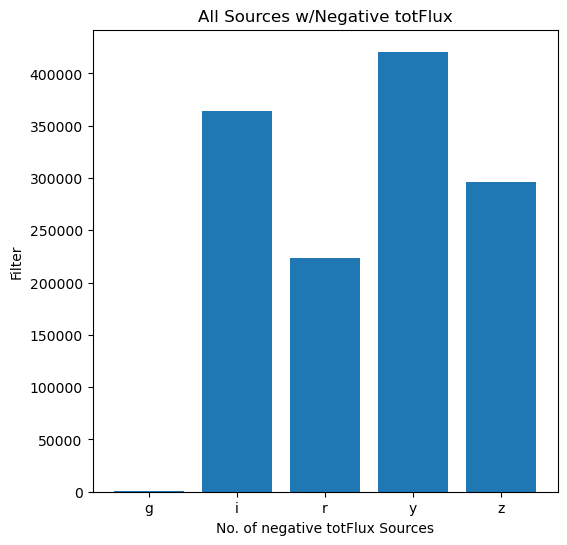

In [38]:
fig = plt.figure(figsize = (6, 6))
plt.bar(all_neg_totFlux_by_filter['filterName'], all_neg_totFlux_by_filter['count'])
plt.ylabel("Filter")
plt.xlabel("No. of negative totFlux Sources")
plt.title("All Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=None)
plt.show()

#### Good negative `totFlux` sources

It's unevenly distributed among the filters when you isolate the 238 good negative `totFlux` sources that were unflagged.

In [39]:
good_not_flagged_by_filter = good_not_flagged.groupby(['filterName']).size().reset_index(name='count')
good_not_flagged_by_filter['filterName'] = good_not_flagged_by_filter['filterName'].astype(str)

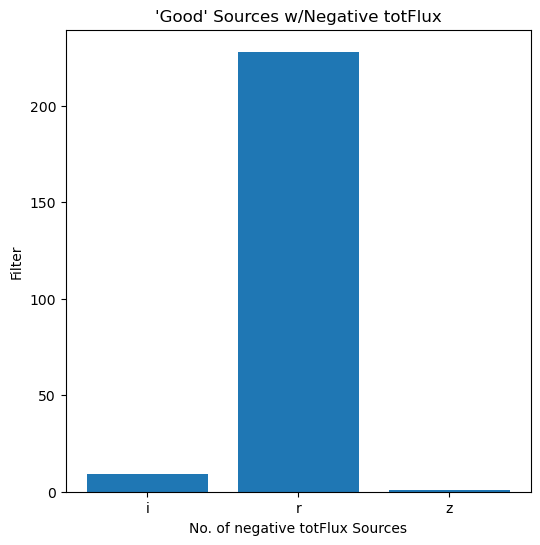

In [40]:
fig = plt.figure(figsize = (6, 6))
plt.bar(good_not_flagged_by_filter['filterName'], good_not_flagged_by_filter['count'])
plt.ylabel("Filter")
plt.xlabel("No. of negative totFlux Sources")
plt.title("'Good' Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=None)
plt.show()

### By SNR

In [41]:
bandList = ['g', 'r', 'i', 'z', 'y']
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

#### All negative `totFlux` sources

There is a wide spread in SNR, particularly in the `r` and `i` bands.

(0.0, 4500.0)

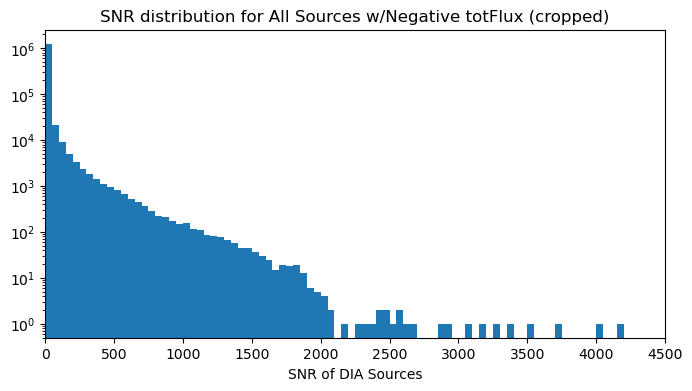

In [42]:
binwidth=50
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(all_neg_totFlux.snr, bins=range(0, int(max(all_neg_totFlux.snr)) + binwidth, binwidth))
plt.title('SNR distribution for All Sources w/Negative totFlux (cropped)')
plt.xlabel('SNR of DIA Sources')
plt.gca().set_xlim(0, 4500)

Text(0.5, 0, 'SNR of DIA Sources')

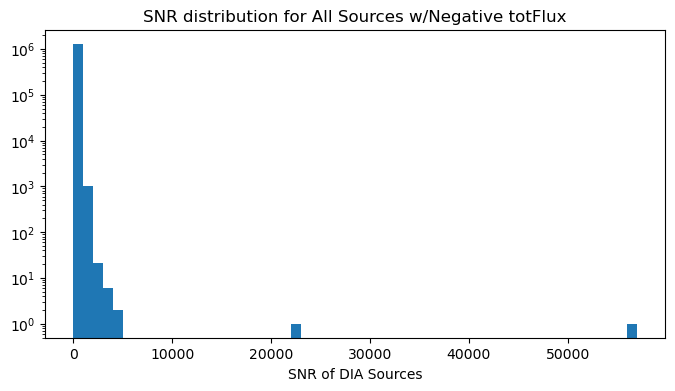

In [43]:
binwidth=1000
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(all_neg_totFlux.snr, bins=range(0, int(max(all_neg_totFlux.snr)) + binwidth, binwidth))
plt.title('SNR distribution for All Sources w/Negative totFlux')
plt.xlabel('SNR of DIA Sources')

(0.0, 4500.0)

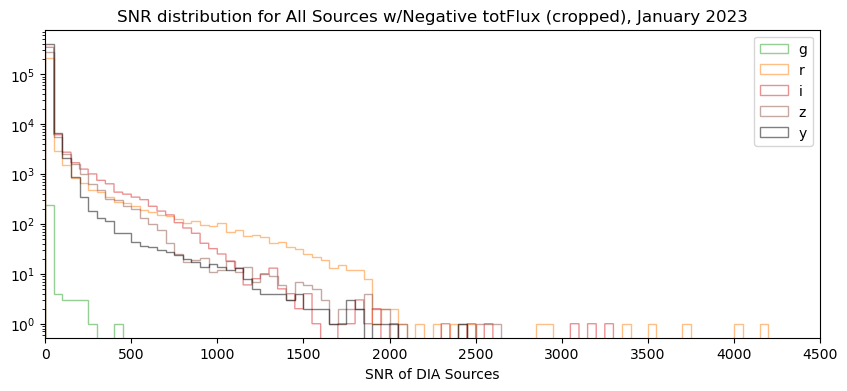

In [44]:
binwidth=50
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = all_neg_totFlux.loc[all_neg_totFlux.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f"SNR distribution for All Sources w/Negative totFlux (cropped), {month} {year}")
plt.xlabel('SNR of DIA Sources')
plt.gca().set_xlim(0, 4500)

Text(0.5, 0, 'SNR of DIA Sources')

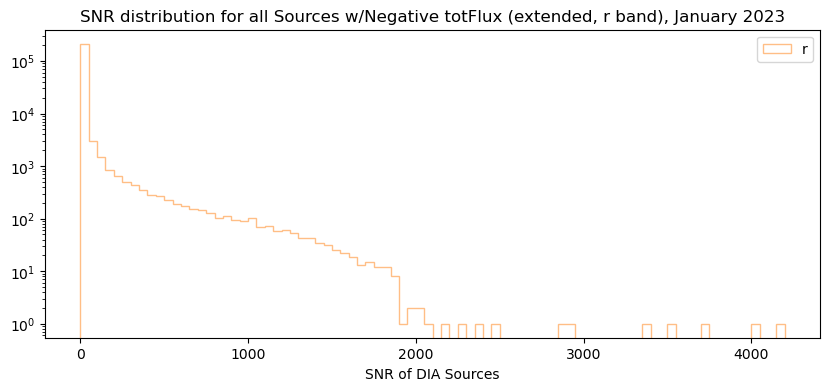

In [45]:
binwidth=50
plt.figure(figsize=(10,4))
plt.yscale('log')
data = all_neg_totFlux.loc[all_neg_totFlux.filterName=='r', 'snr']
snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=colorList[1], alpha=0.5, label='r', histtype='step')
plt.legend()
plt.title(f'SNR distribution for all Sources w/Negative totFlux (extended, r band), {month} {year}')
plt.xlabel('SNR of DIA Sources')

Text(0.5, 0, 'SNR of DIA Sources')

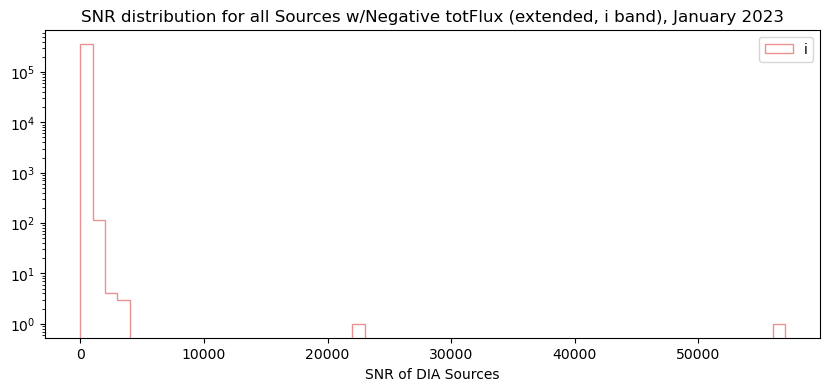

In [46]:
binwidth=1000
plt.figure(figsize=(10,4))
plt.yscale('log')
data = all_neg_totFlux.loc[all_neg_totFlux.filterName=='i', 'snr']
snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=colorList[2], alpha=0.5, label='i', histtype='step')
plt.legend()
plt.title(f'SNR distribution for all Sources w/Negative totFlux (extended, i band), {month} {year}')
plt.xlabel('SNR of DIA Sources')

#### Good negative `totFlux` sources

There is far less noise when you isolate the 238 good negative `totFlux` sources that were unflagged.

Text(0.5, 0, 'SNR of DIA Sources')

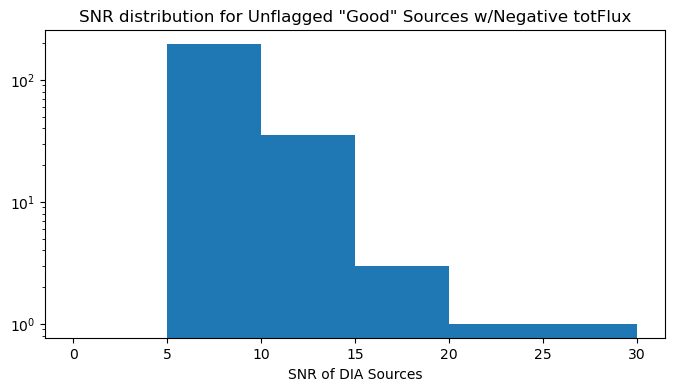

In [47]:
binwidth=5
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(good_not_flagged.snr, bins=range(0, int(max(good_not_flagged.snr)) + binwidth, binwidth))
plt.title('SNR distribution for Unflagged "Good" Sources w/Negative totFlux')
plt.xlabel('SNR of DIA Sources')

Text(0.5, 0, 'SNR of DIA Sources')

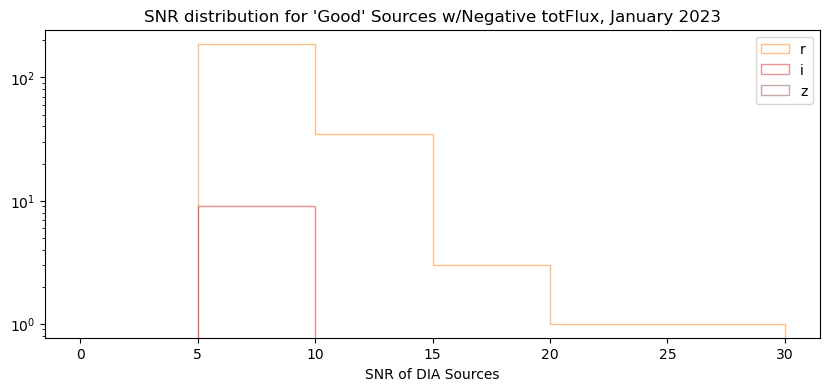

In [48]:
binwidth=5
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    try:
        data = good_not_flagged.loc[good_not_flagged.filterName==band, 'snr']
        snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
    except:
        pass
plt.legend()
plt.title(f"SNR distribution for 'Good' Sources w/Negative totFlux, {month} {year}")
plt.xlabel('SNR of DIA Sources')

## 4. <a id="section_4">Negative `totFlux` as fakes</a>

### Loading fakes

In [49]:
def collectMatchedDiaSources(fakesMatchDiaSrc, maxi=-1):
    """Given a butler query of fakesMatchDiaSrc datasetRefs, create a pandas dataframe with them all.
    'All' is defined as up to maxi of them, so it doesn't take forever.
    
    If you really want all of them, set maxi to -1.
    """
    #%%time
    visitDetectorFrames = []

    i = 0

    for datasetRef in fakesMatchDiaSrc: 
        try:
            frame = butler.getDirect(datasetRef)
            # nondetected sources don't have DIASource records--so propagate metadata to all rows
            # grab a detected row
            w = frame['diaSourceId'] > 0
            if np.sum(w) == 0:
                print(f'No real sources detected in {datasetRef}')
                continue
            ccdVisitId = int(frame.loc[w,'ccdVisitId'].iloc[0])
            filterName = frame.loc[w,'filterName'].iloc[0]
            # propagate to all rows
            frame.loc[:,'ccdVisitId'] = ccdVisitId 
            frame.loc[:,'filterName'] = filterName 
        except Exception as e:
            raise(e)
        else:
            visitDetectorFrames.append(frame)
        i+=1
        if i == maxi:
            break

    matchedDiaSources = pd.concat(visitDetectorFrames)

    matchedDiaSources.loc[:,'ra'] = np.degrees(matchedDiaSources['ra_x'])
    matchedDiaSources.loc[:,'decl'] = np.degrees(matchedDiaSources['dec'])

    return matchedDiaSources

In [50]:
fakesMatchDiaSrc = butler.registry.queryDatasets(collections=collections,
                                                 datasetType='fakes_goodSeeingDiff_matchDiaSrc')
matchedDiaSources = collectMatchedDiaSources(fakesMatchDiaSrc)

No real sources detected in fakes_goodSeeingDiff_matchDiaSrc@{instrument: 'HSC', detector: 69, visit: 29340, ...}, sc=DataFrame] (id=328825ac-260d-4adf-821f-a14c3530db2f)


In [51]:
instrumentDataId = butler.registry.expandDataId(instrument=instrument)
packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
dataId = packer.unpack(matchedDiaSources.ccdVisitId)
matchedDiaSources['visit'] = dataId['visit']
matchedDiaSources['detector'] = dataId['detector']

### Counts and Flags

In [52]:
num_fakes = len(matchedDiaSources)
is_fake = np.array(matchedDiaSources.totFlux < 0)
neg_fakes = matchedDiaSources[is_fake].reset_index(drop=True)
num_neg_fakes = len(neg_fakes)

print("There are " + str(num_fakes) + " fakes and " + str(num_neg_fakes) + " of them have a negative totFlux.")

There are 471143 fakes and 81265 of them have a negative totFlux.


In [53]:
neg_fakes['flags'] = neg_fakes['flags'].astype('int')
neg_fakes, good_neg_fakes = flagTables(neg_fakes, badFlagList, butler)

In [54]:
print("The lowest negative totFlux value for all fake sources is" + str(min(neg_fakes.totFlux)))
print("The highest negative totFlux value for all fake sources is" + str(max(neg_fakes.totFlux)))

The lowest negative totFlux value for all fake sources is-4245670.4629117325
The highest negative totFlux value for all fake sources is-0.0010648388531466096


In [55]:
print("The lowest negative totFlux value for fake good sources is" + str(min(good_neg_fakes.totFlux)))
print("The highest negative totFlux value for fake good sources is" + str(max(good_neg_fakes.totFlux)))

The lowest negative totFlux value for fake good sources is-2810.8126251648278
The highest negative totFlux value for fake good sources is-0.003016183619124802


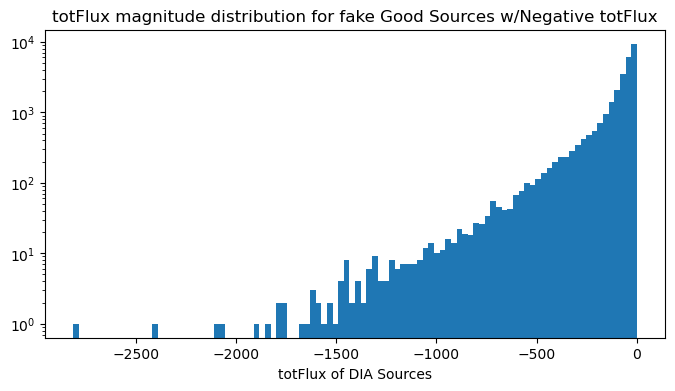

In [56]:
plt.figure(figsize=(8,4))
plt.hist(good_neg_fakes.totFlux, bins=100)
plt.title('totFlux magnitude distribution for fake Good Sources w/Negative totFlux')
plt.xlabel('totFlux of DIA Sources')
plt.yscale('log')

Let's check out the flags...

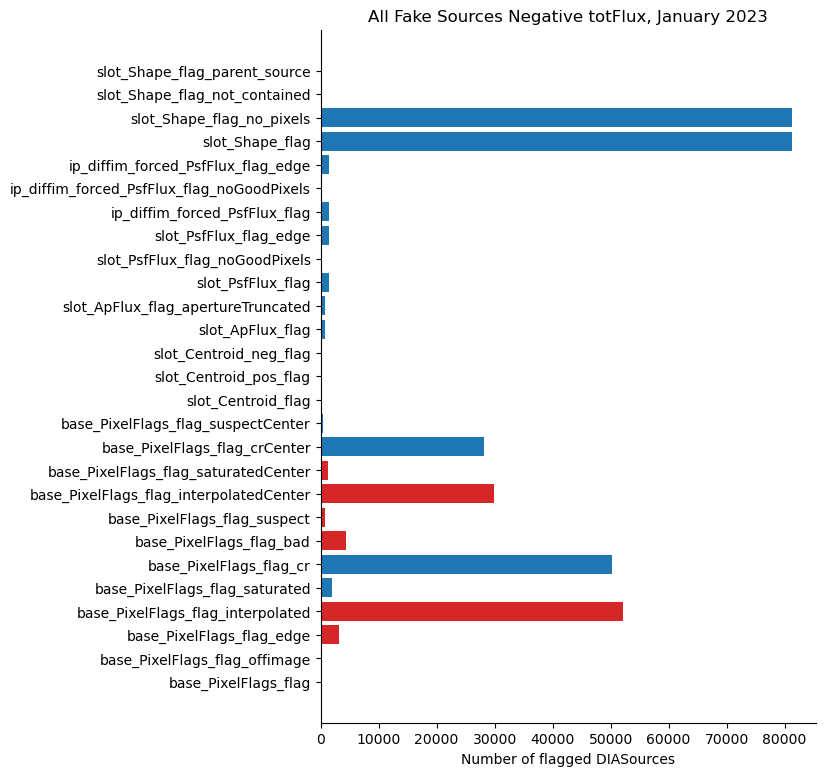

In [57]:
plac.plotFlagHist(neg_fakes, title=f'All Fake Sources Negative totFlux, {month} {year}', badFlagList=badFlagList)

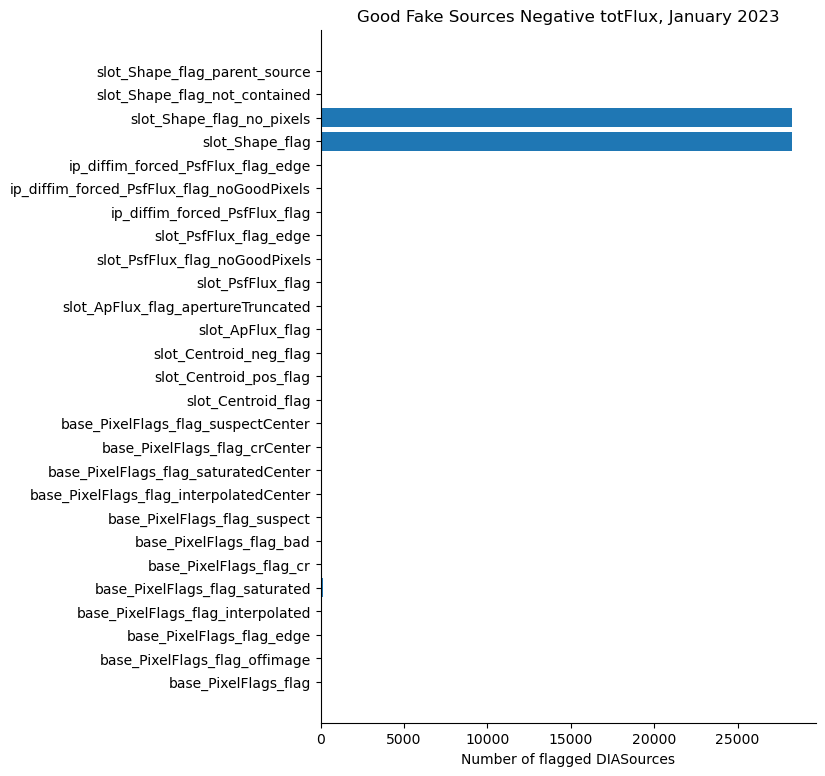

In [58]:
plac.plotFlagHist(good_neg_fakes, title=f'Good Fake Sources Negative totFlux, {month} {year}', badFlagList=badFlagList)

A familiar pattern, let's see if there are any that aren't covered by one of those flags...

In [59]:
is_not_flagged = np.array(neg_fakes.slot_Shape_flag != True)
all_fakes_not_flagged = neg_fakes[is_not_flagged].reset_index(drop=True)
num_all_fakes_not_flagged = len(all_fakes_not_flagged)
num_all_fakes_not_flagged

0

In [60]:
is_not_flagged = np.array(good_neg_fakes.slot_Shape_flag != True)
good_fakes_not_flagged = good_neg_fakes[is_not_flagged].reset_index(drop=True)
num_good_fakes_not_flagged = len(good_fakes_not_flagged)
num_good_fakes_not_flagged

0

So unlike the others, ALL negative `totFlux` fakes were marked appropriately with a `slot_Shape_flag`.

Now let's see how many of the no-flag "Good" negative `totFlux` sources are fakes...

In [61]:
in_both = np.isin(good_not_flagged['diaSourceId'], neg_fakes['diaSourceId'])
good_not_flagged_fakes = good_not_flagged[in_both]
num_good_not_flagged_fakes = len(good_not_flagged_fakes)
num_good_not_flagged_fakes

0

### By Visit

#### All negative `totFlux` sources

Negative `totFlux` sources are unevenly distributed among the visits but not in any definitive way.

In [62]:
all_neg_totFlux_by_detector = all_neg_totFlux.groupby(['detector']).size().reset_index(name='count')
all_neg_totFlux_by_detector['detector'] = all_neg_totFlux_by_detector['detector'].astype(str)

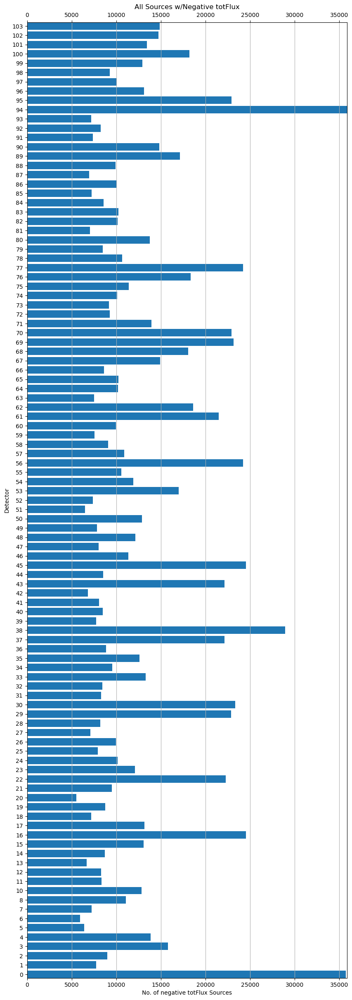

In [63]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_detector['detector'], all_neg_totFlux_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("All Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

#### Good negative `totFlux` sources

Negative `totFlux` sources are unevenly distributed among the detectors when you isolate the 238 good sources.

In [64]:
good_not_flagged_by_detector = good_not_flagged.groupby(['detector']).size().reset_index(name='count')
good_not_flagged_by_detector['detector'] = good_not_flagged_by_detector['detector'].astype(str)

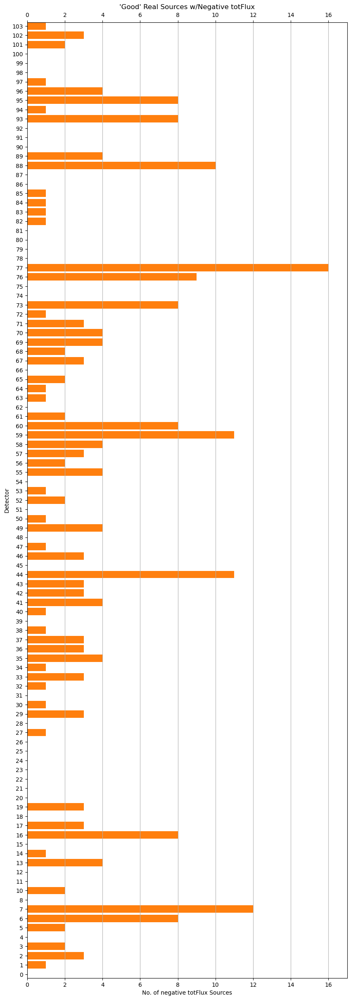

In [65]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_detector['detector'], all_neg_totFlux_by_detector['count'], alpha=0)
plt.barh(good_not_flagged_by_detector['detector'], good_not_flagged_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("'Good' Real Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.xlim(0, 17)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

In [66]:
neg_fakes_by_visit = neg_fakes.groupby(['visit']).size().reset_index(name='count')
neg_fakes_by_visit['visit'] = neg_fakes_by_visit['visit'].astype(str)

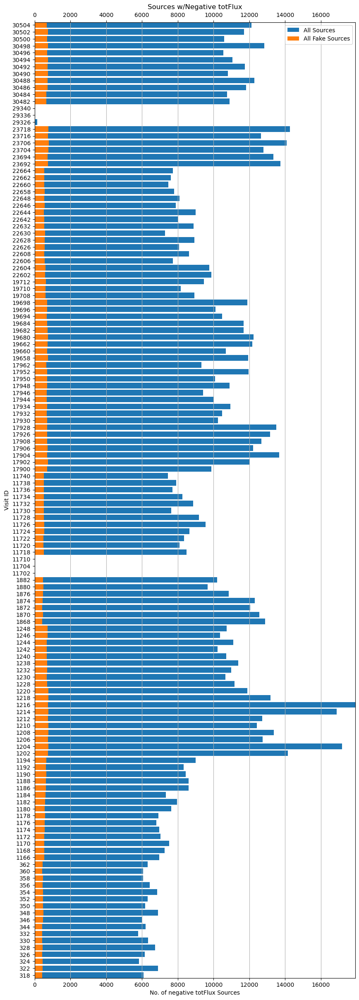

In [67]:
fig = plt.figure(figsize = (10, 30))
plt.barh(all_neg_totFlux_by_visit['visit'], all_neg_totFlux_by_visit['count'], color="C0", label="All Sources")
plt.barh(neg_fakes_by_visit['visit'], neg_fakes_by_visit['count'], color="C1", label="All Fake Sources")
plt.ylabel("Visit ID")
plt.xlabel("No. of negative totFlux Sources")
plt.title("Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.legend()
plt.show()

In [68]:
good_neg_fakes_by_visit = good_neg_fakes.groupby(['visit']).size().reset_index(name='count')
good_neg_fakes_by_visit['visit'] = good_neg_fakes_by_visit['visit'].astype(str)

good_neg_totFlux_by_visit = good_neg_totFlux.groupby(['visit']).size().reset_index(name='count')
good_neg_totFlux_by_visit['visit'] = good_neg_totFlux_by_visit['visit'].astype(str)

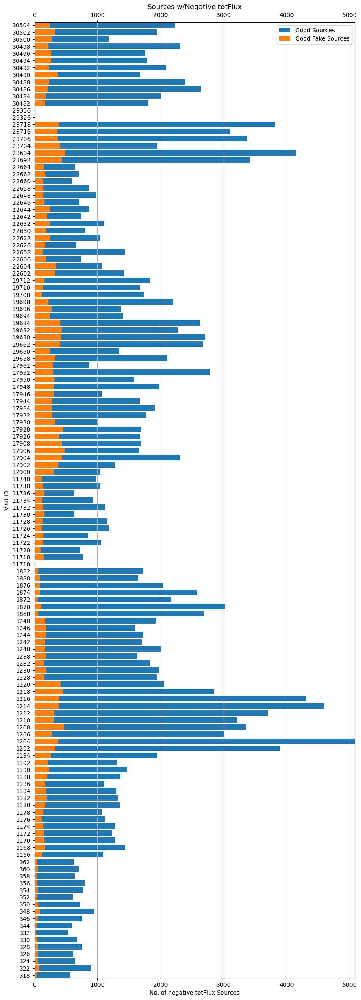

In [69]:
fig = plt.figure(figsize = (10, 30))
plt.barh(good_neg_totFlux_by_visit['visit'], good_neg_totFlux_by_visit['count'], color="C0", label="Good Sources")
plt.barh(good_neg_fakes_by_visit['visit'], good_neg_fakes_by_visit['count'], color="C1", label="Good Fake Sources")
plt.ylabel("Visit ID")
plt.xlabel("No. of negative totFlux Sources")
plt.title("Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.legend()
plt.show()

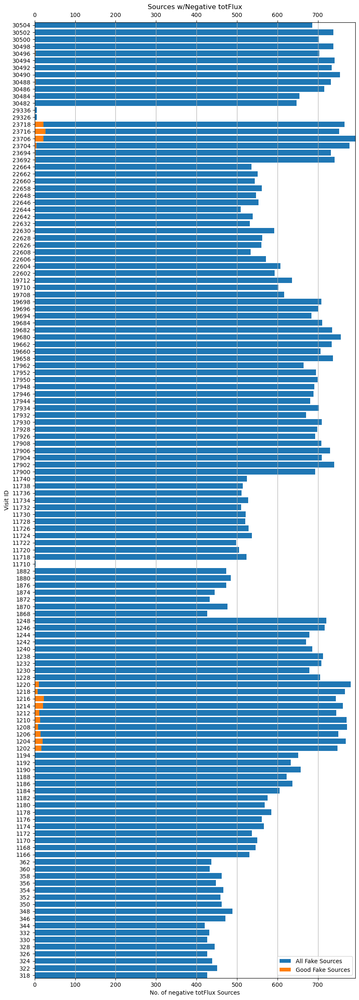

In [70]:
fig = plt.figure(figsize = (10, 30))
plt.barh(neg_fakes_by_visit['visit'], neg_fakes_by_visit['count'], color="C0", label="All Fake Sources")
plt.barh(good_not_flagged_by_visit['visit'], good_not_flagged_by_visit['count'], color="C1", label="Good Fake Sources")
plt.ylabel("Visit ID")
plt.xlabel("No. of negative totFlux Sources")
plt.title("Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.legend()
plt.show()

### By Detector

#### All negative fake `totFlux` sources

Negative fake `totFlux` sources are unevenly distributed among the detectors but not in any definitive way.

In [71]:
neg_fakes_by_detector = neg_fakes.groupby(['detector']).size().reset_index(name='count')
neg_fakes_by_detector['detector'] = neg_fakes_by_detector['detector'].astype(str)

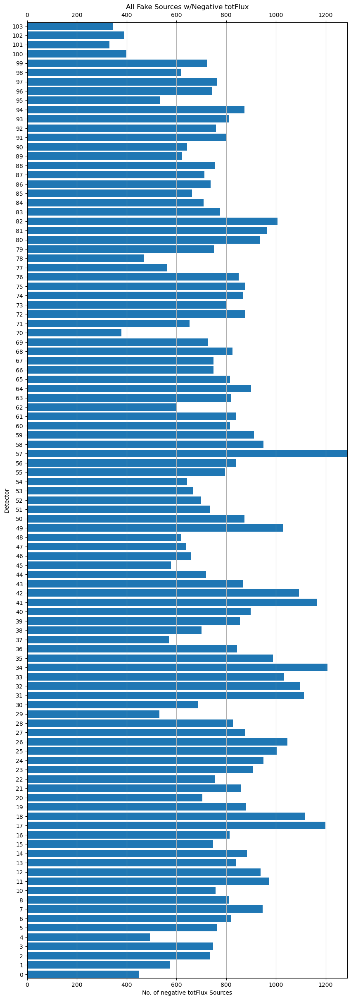

In [72]:
fig = plt.figure(figsize = (10, 30))
plt.barh(neg_fakes_by_detector['detector'], neg_fakes_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("All Fake Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

#### Good negative `totFlux` sources

Negative `totFlux` sources are unevenly distributed among the detectors but not in any definitive way.

In [73]:
good_neg_fakes_by_detector = good_neg_fakes.groupby(['detector']).size().reset_index(name='count')
good_neg_fakes_by_detector['detector'] = good_neg_fakes_by_detector['detector'].astype(str)

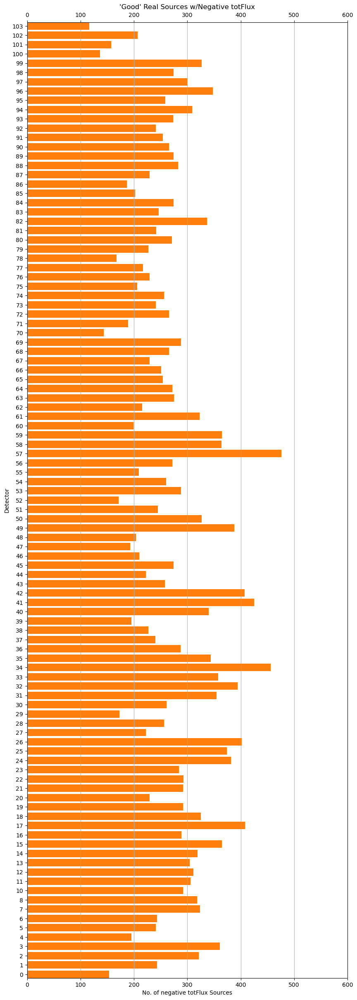

In [74]:
fig = plt.figure(figsize = (10, 30))
plt.barh(neg_fakes_by_detector['detector'], neg_fakes_by_detector['count'], alpha=0)
plt.barh(good_neg_fakes_by_detector['detector'], good_neg_fakes_by_detector['count'])
plt.ylabel("Detector")
plt.xlabel("No. of negative totFlux Sources")
plt.title("'Good' Real Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=True)
plt.xlim(0, 600)
plt.grid(visible=True, which='major', axis='x')
plt.tick_params(axis="x", bottom=True, top=True, labelbottom=True, labeltop=True)
plt.show()

### By Filter

In [75]:
neg_fakes_by_filter = neg_fakes.groupby(['filterName']).size().reset_index(name='count')
neg_fakes_by_filter['filterName'] = neg_fakes_by_filter['filterName'].astype(str)

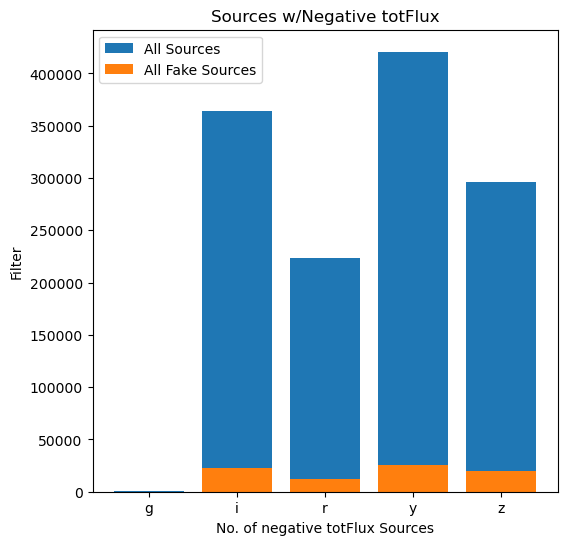

In [76]:
fig = plt.figure(figsize = (6, 6))
plt.bar(all_neg_totFlux_by_filter['filterName'], all_neg_totFlux_by_filter['count'], color="C0", label="All Sources")
plt.bar(neg_fakes_by_filter['filterName'], neg_fakes_by_filter['count'], color="C1", label="All Fake Sources")
plt.ylabel("Filter")
plt.xlabel("No. of negative totFlux Sources")
plt.title("Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=None)
plt.legend()
plt.show()

In [77]:
good_neg_fakes_by_filter = good_neg_fakes.groupby(['filterName']).size().reset_index(name='count')
good_neg_fakes_by_filter['filterName'] = good_neg_fakes_by_filter['filterName'].astype(str)

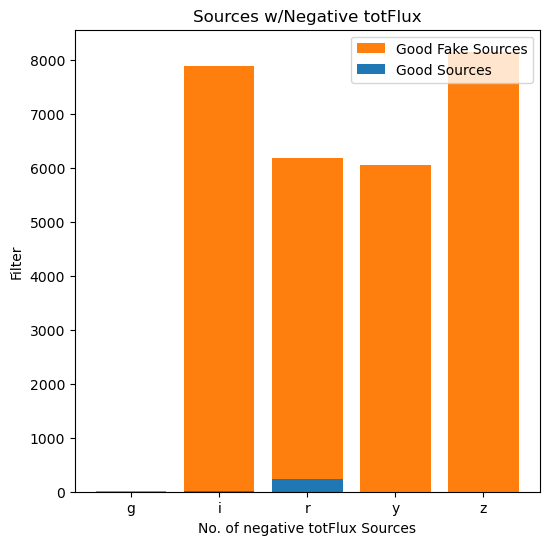

In [78]:
fig = plt.figure(figsize = (6, 6))
plt.bar(good_neg_fakes_by_filter['filterName'], good_neg_fakes_by_filter['count'], color="C1", label="Good Fake Sources")
plt.bar(good_not_flagged_by_filter['filterName'], good_not_flagged_by_filter['count'], color="C0", label="Good Sources")
plt.ylabel("Filter")
plt.xlabel("No. of negative totFlux Sources")
plt.title("Sources w/Negative totFlux")
plt.autoscale(enable=True, axis='both', tight=None)
plt.legend()
plt.show()

### By SNR

In [79]:
bandList = ['g', 'r', 'i', 'z', 'y']
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

#### All negative fake `totFlux` sources

There is a wide spread in SNR, particularly in the `r` and `i` bands.

Text(0.5, 0, 'SNR of DIA Sources')

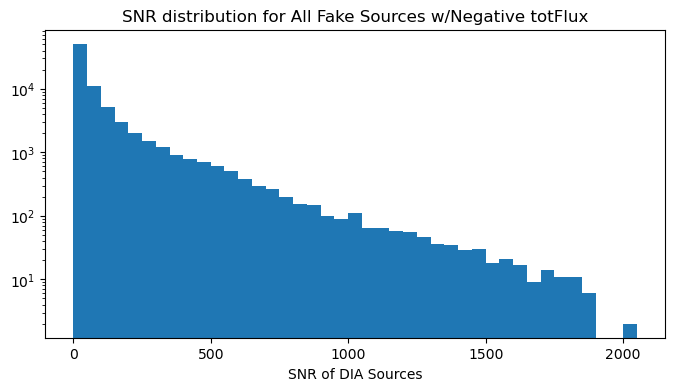

In [80]:
binwidth=50
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(neg_fakes.snr, bins=range(0, int(max(neg_fakes.snr)) + binwidth, binwidth))
plt.title('SNR distribution for All Fake Sources w/Negative totFlux')
plt.xlabel('SNR of DIA Sources')

Text(0.5, 0, 'SNR of DIA Sources')

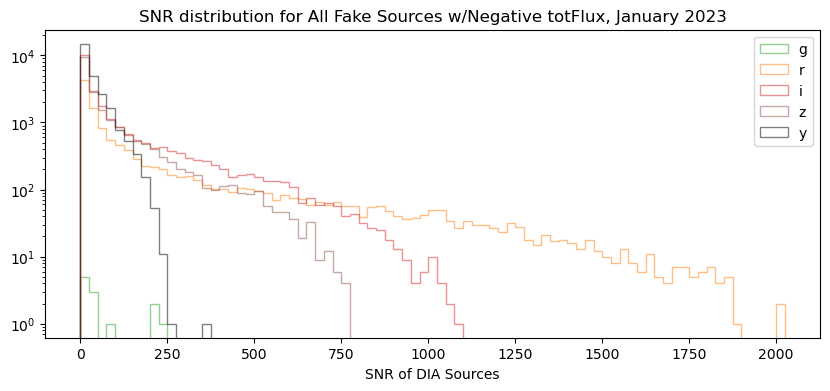

In [81]:
binwidth=25
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = neg_fakes.loc[neg_fakes.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f"SNR distribution for All Fake Sources w/Negative totFlux, {month} {year}")
plt.xlabel('SNR of DIA Sources')

#### Good negative fake `totFlux` sources

The spread in SNR in the "good" negative `totFlux` fakes is consistent with all negative `totFlux` fakes.

Text(0.5, 0, 'SNR of DIA Sources')

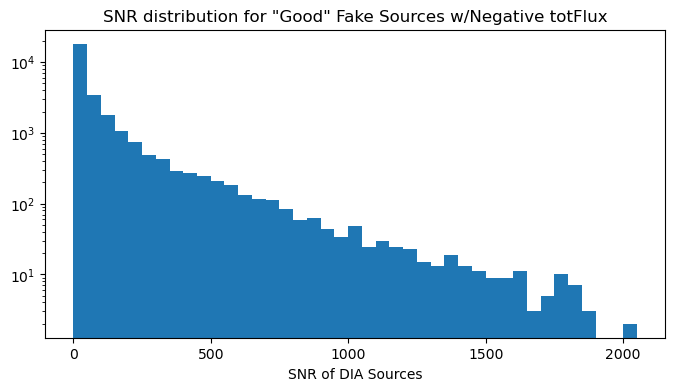

In [82]:
binwidth=50
plt.figure(figsize=(8,4))
plt.yscale('log')
snrHist = plt.hist(good_neg_fakes.snr, bins=range(0, int(max(good_neg_fakes.snr)) + binwidth, binwidth))
plt.title('SNR distribution for "Good" Fake Sources w/Negative totFlux')
plt.xlabel('SNR of DIA Sources')

Text(0.5, 0, 'SNR of DIA Sources')

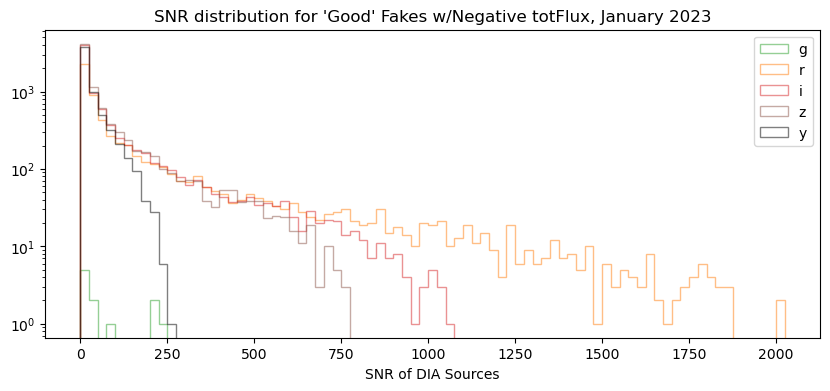

In [83]:
binwidth=25
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    try:
        data = good_neg_fakes.loc[good_neg_fakes.filterName==band, 'snr']
        snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
    except:
        pass
plt.legend()
plt.title(f"SNR distribution for 'Good' Fakes w/Negative totFlux, {month} {year}")
plt.xlabel('SNR of DIA Sources')

## 5. <a id="section_5">Negative `totFlux` as cutouts</a>

In [84]:
config = zoo.ZooniverseCutoutsConfig()
config.url_root = ''
config.diff_image_type = 'fakes_goodSeeingDiff'
config.add_metadata = True
config.chunk_size = None

Focusing on the unflagged remaining good sources first.

In [85]:
path_not_fake = '/sdf/group/rubin/u/elhoward/repo-main-logs/DM-32888/not_fake'

In [86]:
zc_not_fake = zoo.ZooniverseCutoutsTask(output_path=path_not_fake, config=config)

In [87]:
zc_not_fake.write_images(good_not_flagged.head(50), butler, njobs=8)

[518067545179107,
 518071840146544,
 13093815539729726,
 523277340509583,
 10175801873925871,
 519847809122802,
 523232243352824,
 523232243352828,
 523232243352845,
 10186897921934078,
 517277271196545,
 517277271196718,
 13098136276829367,
 520638083105402,
 10180884967719828,
 520668147876854,
 520625198204210,
 518123379753962,
 13096405405009291,
 10187022475986865,
 524026812302403,
 10186088320600339,
 517202109269050,
 521559353591257,
 10181855630328829,
 10186818465038999,
 10186818465038997,
 10186818465038998,
 10186818465039050,
 10186818465039053,
 522379692344558,
 516444047540831,
 516330230908587,
 517985940800100,
 7710490646023490,
 517320220869335,
 10185957324096091,
 10185957324096158,
 10185957324096160,
 516345263292984,
 521565796042469,
 10186101205500494,
 518099757433359,
 521490634115920,
 520640230588907,
 10186034633507488,
 520678885295112,
 516381770515212,
 522396872213588,
 522396872213886]

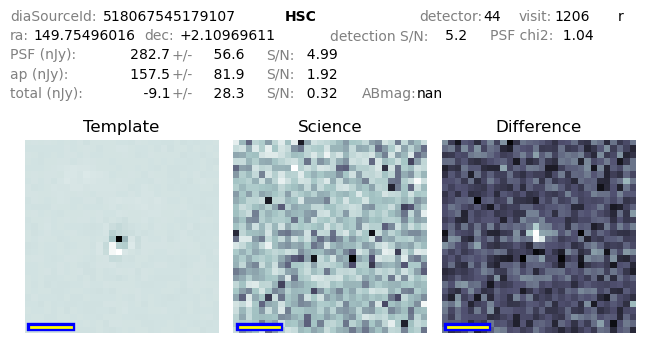

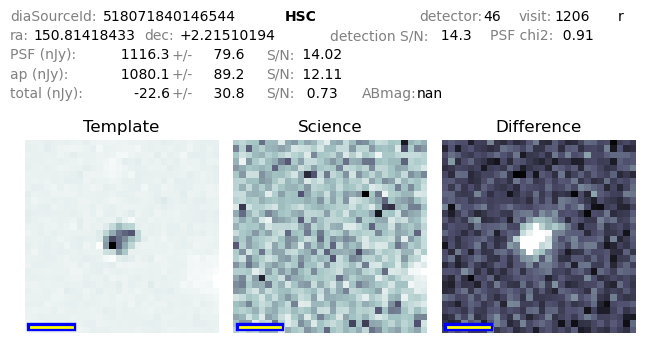

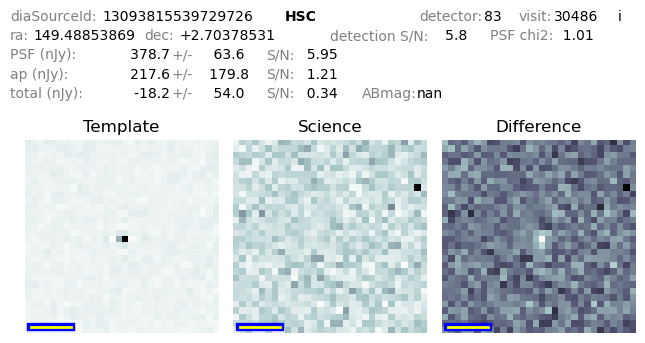

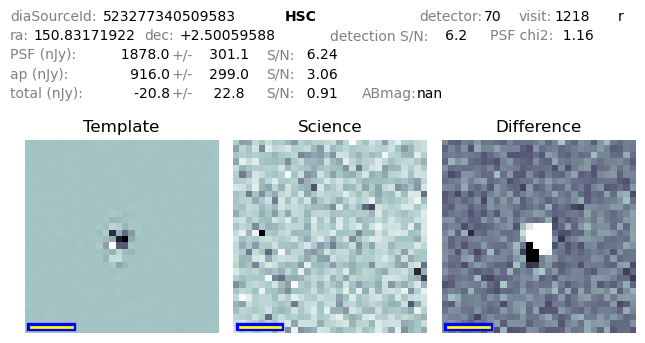

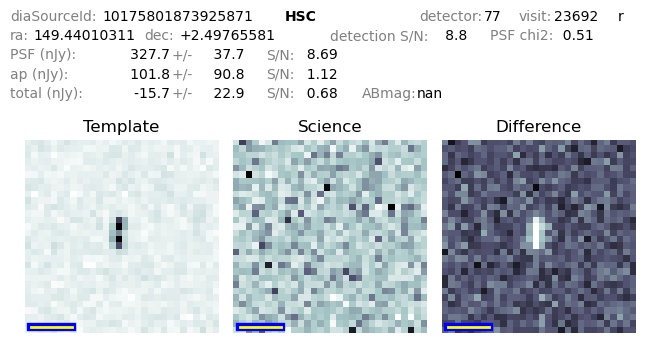

...

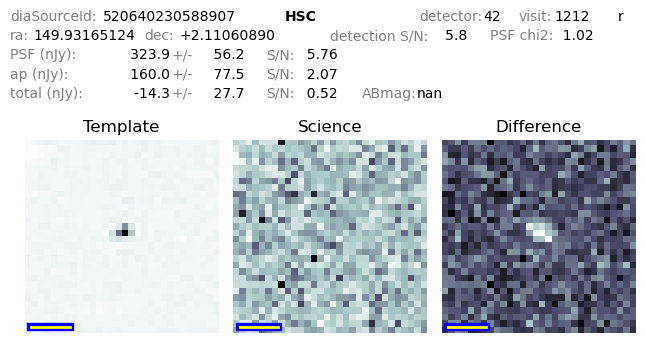

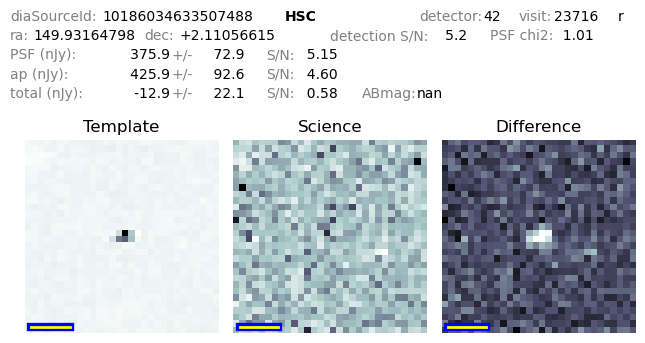

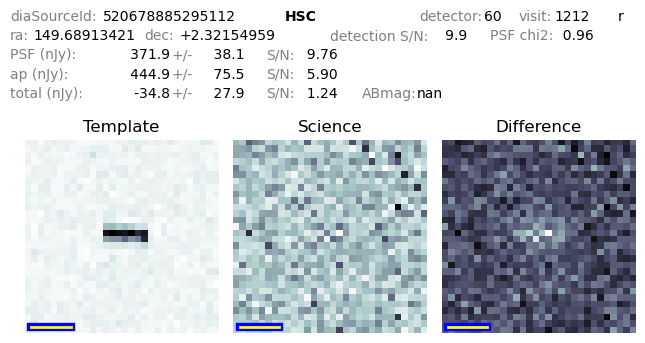

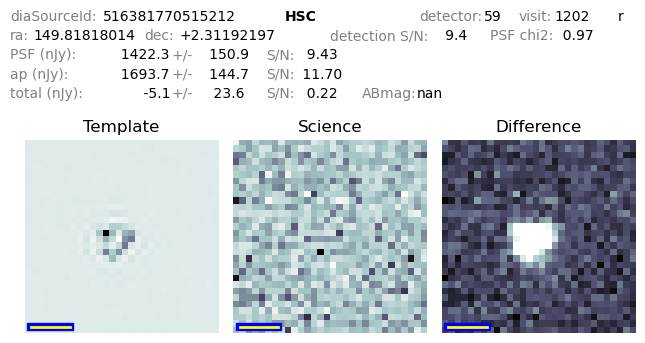

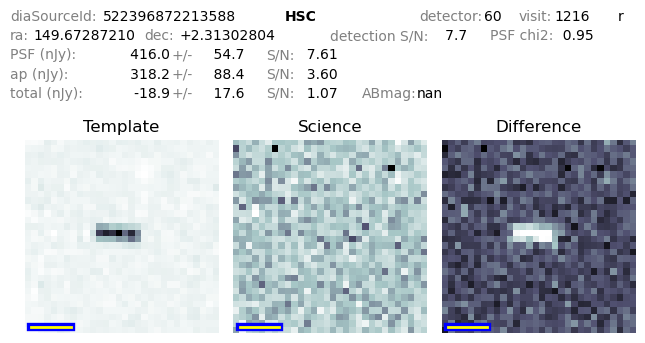

In [88]:
i = 0
for source in good_not_flagged['diaSourceId']:
    base_image_path = os.path.join(path_not_fake, f"images/{source}.png")
    if os.path.exists(base_image_path):
        display(Image(base_image_path))
        i += 1
        if i == 49:
            break

Now let's take a look at the 'good' fakes...

In [89]:
spuriousness = all_neg_totFlux[["diaSourceId", "spuriousness", "instrument"]].copy()
good_neg_fakes_sp = pd.merge(good_neg_fakes, spuriousness, how='inner', on = 'diaSourceId')

In [90]:
path_fake = '/sdf/group/rubin/u/elhoward/repo-main-logs/DM-32888/fake'

In [91]:
zc_fake = zoo.ZooniverseCutoutsTask(output_path=path_fake, config=config)

In [92]:
zc_fake.write_images(good_neg_fakes_sp.head(50), butler, njobs=8)

[13096306620760883,
 13096306620760880,
 13096306620761177,
 9731631388557784,
 8454346769433851,
 8454346769433871,
 8454346769433735,
 9731642125975928,
 9731642125975953,
 9727276291720070,
 13096276555990371,
 13096276555990463,
 13096276555990510,
 522484919042962,
 522484919043198,
 522484919042917,
 522484919043101,
 5038052472783335,
 9708479367349024,
 9708479367349300,
 9708479367349101,
 9708479367348923,
 9708479367348961,
 9708479367348921,
 7689814673458096,
 7689814673458378,
 7689814673458342,
 7689814673458243,
 7689814673458261,
 7689814673458400,
 7689814673458274,
 529176478090234,
 529176478090219,
 529176478090067,
 529176478090261,
 529176478090171,
 7714693271520174,
 7710449843831665,
 7710449843831521,
 7710449843831379,
 7710449843831642,
 7689013662057777,
 7689013662057434,
 9732580576330476,
 9732580576330299,
 9732580576330217,
 9717988424941893,
 9732434547441977,
 9732434547442190,
 13099830641427166]

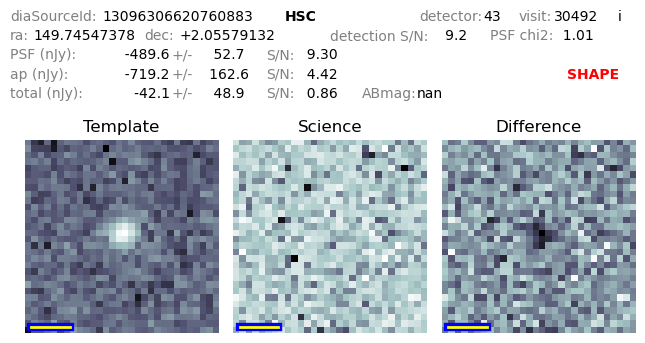

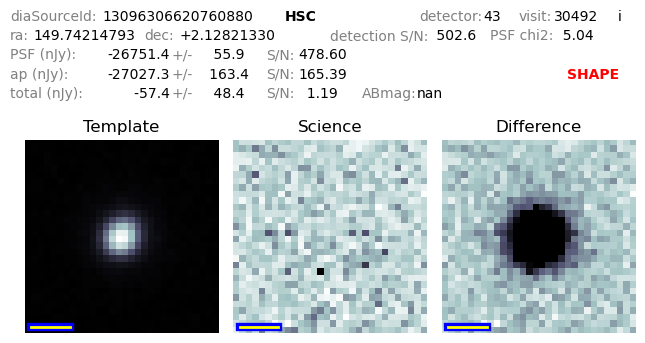

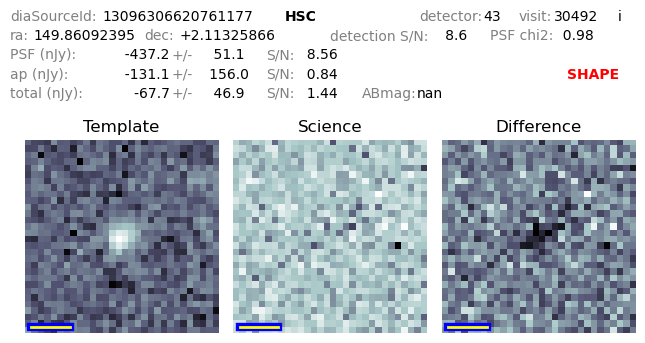

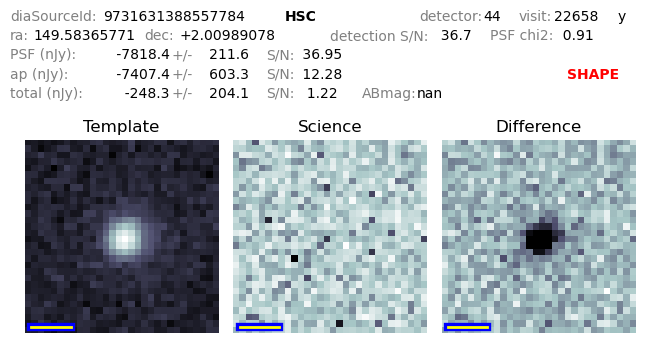

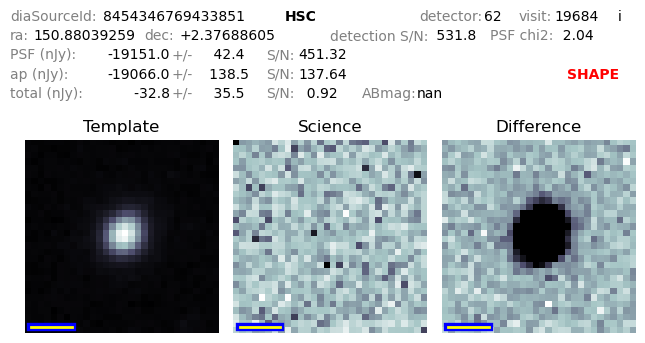

...

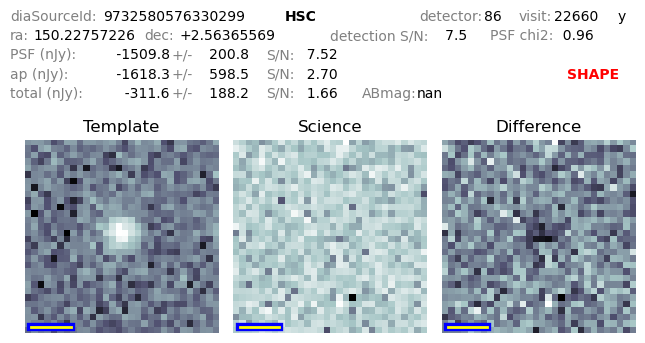

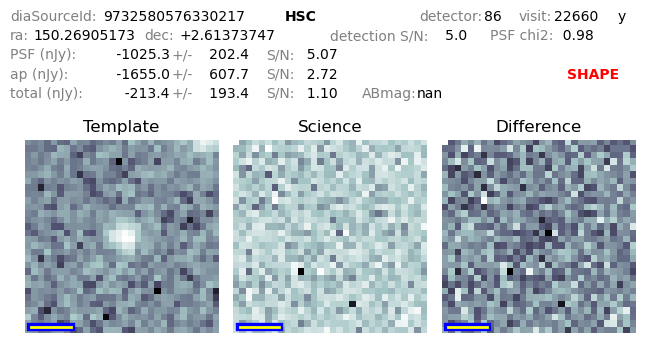

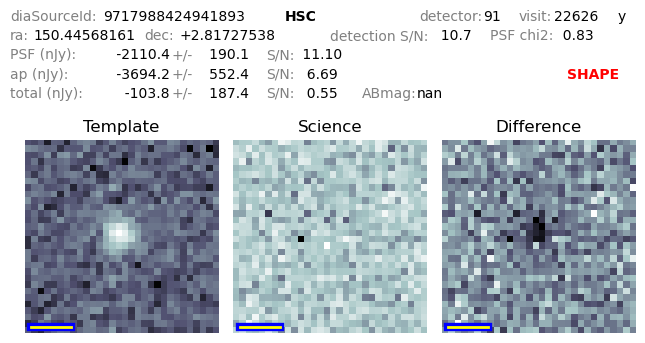

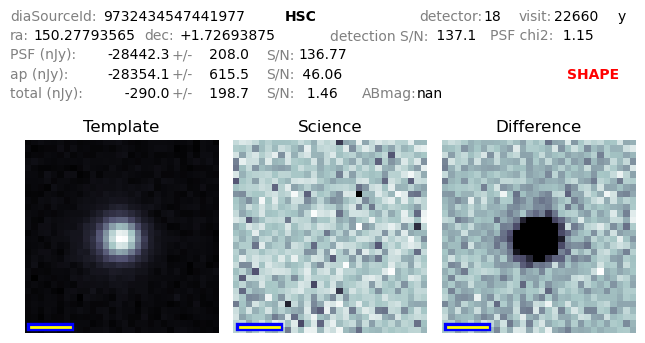

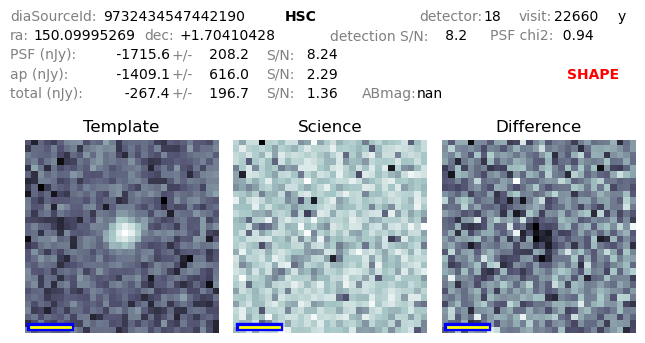

In [93]:
i = 0
for source in good_neg_fakes_sp['diaSourceId']:
    base_image_path = os.path.join(path_fake, f"images/{source}.png")
    if os.path.exists(base_image_path):
        display(Image(base_image_path))
        i += 1
        if i == 49:
            break